# Теория:

### 1. [Алгоритм Лювена](https://en.wikipedia.org/wiki/Louvain_method)

### 2. [Algorithm Ravasz](https://barabasi.com/f/108.pdf)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import networkx as nx

In [ ]:
KC = nx.karate_club_graph()

In [ ]:
KC = nx.karate_club_graph()
from itertools import count
groups = set(nx.get_node_attributes(KC,'club').values())
mapping = dict(zip(sorted(groups),count()))
nodes = KC.nodes()
colors = [mapping[KC.node[n]['club']] for n in nodes]
nx.draw(KC,node_size=500,with_labels=True,node_color=colors,cmap='GnBu')

AttributeError: ignored

In [ ]:
import community as co
partition = co.best_partition(KC)
partition

{0: 0,
 1: 0,
 2: 0,
 3: 0,
 4: 1,
 5: 1,
 6: 1,
 7: 0,
 8: 2,
 9: 0,
 10: 1,
 11: 0,
 12: 0,
 13: 0,
 14: 2,
 15: 2,
 16: 1,
 17: 0,
 18: 2,
 19: 0,
 20: 2,
 21: 0,
 22: 2,
 23: 3,
 24: 3,
 25: 3,
 26: 2,
 27: 3,
 28: 3,
 29: 2,
 30: 2,
 31: 3,
 32: 2,
 33: 2}

In [ ]:
nx.stochastic_block_model?

Object `nx.stochastic_block_model` not found.


# Практика 

1. генератор блочно-стохастической модели

* визуализация сети и матрицы смежности
* простейшие свойства (число ребер, средняя степень узла, кластеризация) 

In [ ]:
print(nx.number_of_nodes(KC)) 
print(nx.number_of_edges(KC))
print(nx.density(KC))
print(nx.transitivity(KC))
print(nx.nx.average_clustering(KC))

34
78
0.13903743315508021
0.2556818181818182
0.5706384782076823


In [ ]:
sizes=[40,70,20]
probs=[[0.25, 0.03, 0.08], [0.03, 0.60, 0.07], [0.08, 0.07, 0.40]]
G=nx.stochastic_block_model(sizes, probs, seed=0)


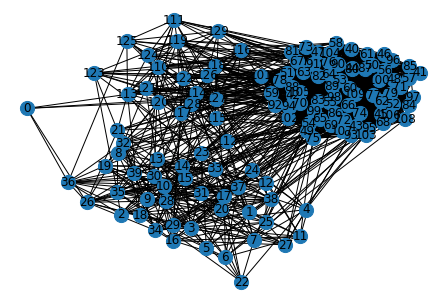

In [ ]:
nx.draw(G, node_size=200, with_labels=True)

In [ ]:
print(nx.number_of_nodes(G), '-количество узлов') 
print(nx.number_of_edges(G), '-количество ребер')
print(nx.density(G), '-плотность(средняя степень узла)')
print(nx.transitivity(G), '-транзитивность')
print(nx.nx.average_clustering(G), '-кластеризация')

130 -количество узлов
1949 -количество ребер
0.23243887895050686 -плотность(средняя степень узла)
0.4905259033278289 -транзитивность
0.36874244789992605 -кластеризация


In [ ]:
nodes = G.nodes()
nodes

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 128, 129, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127))

In [ ]:
#матрица смежности
print(nx.adjacency_matrix(G))

  (0, 26)	1
  (0, 36)	1
  (0, 59)	1
  (0, 101)	1
  (0, 122)	1
  (1, 3)	1
  (1, 6)	1
  (1, 9)	1
  (1, 11)	1
  (1, 15)	1
  (1, 19)	1
  (1, 33)	1
  (1, 34)	1
  (1, 38)	1
  (1, 52)	1
  (1, 105)	1
  (1, 110)	1
  (1, 114)	1
  (2, 23)	1
  (2, 28)	1
  (2, 30)	1
  (2, 31)	1
  (2, 35)	1
  (2, 36)	1
  (2, 38)	1
  :	:
  (128, 115)	1
  (128, 117)	1
  (128, 119)	1
  (128, 120)	1
  (128, 124)	1
  (128, 125)	1
  (128, 126)	1
  (129, 4)	1
  (129, 11)	1
  (129, 39)	1
  (129, 44)	1
  (129, 53)	1
  (129, 61)	1
  (129, 65)	1
  (129, 77)	1
  (129, 110)	1
  (129, 111)	1
  (129, 112)	1
  (129, 113)	1
  (129, 115)	1
  (129, 116)	1
  (129, 118)	1
  (129, 122)	1
  (129, 123)	1
  (129, 127)	1


**Ravasz Algorithm**

Данный алгоритм является агломеративной иерархической кластеризацией и был предложен для идентефикации функциональных модулей в метаболических сетях. 

Алгоритм состоит из следующих шагов:

**Шаг 1** Определить матрицу подобия(сходства?)

В кратце матрица подобия(сходства) состоит их элементов $x_{ij}$, которые отображают расстояние от узла i до узла j.

В агломеративном алгоритме сходство должно быть высокое для пар узлов, принадлежащих одному сообществу, и низким для пар узлов из разных сообществ. В контексте сетей узлы, которые соединены друг с другом и имеют общих соседей скорее всего принадлежат к одному сообществу и следовательно $x_{ij}$ будет большим.

Матрица топологического перекрытия
$$x_{ij}^{o}=\frac{J(i,j)}{min(k_i,k_j)+1-\theta(A_{ij})}$$
отражает это ожидание.

Здесь $$\theta(A_{ij}) - \text{ступенчатая функция Хевисайда}$$ 
$$\theta(X)= \begin{cases}
   0 &\text{x $\leq 0$}\\
   1&\text{x $>0$} 
 \end{cases}$$

 
 J(i,j) - число общих соседей узлов i и j, к которому мы прибавляем 1, если есть прямая связь между ними.
 $$min(k_i, k_j)-\text{меньшаяя из степеней $k_i$  $k_j$}$$
 Как следствие:
 $$x_{ij}^{o}=1\text{, если i и j имеют связь и у них одинаковые соседи}$$
 $$x_{ij}^{o}=0\text{, если i и j не имеют общих соседей и не связаны}$$
Члены одного и того же сообщества плотного окружения локальной сети имеют высокое топологические перекрытие, как узлы H, I, J, K или E, F, G.

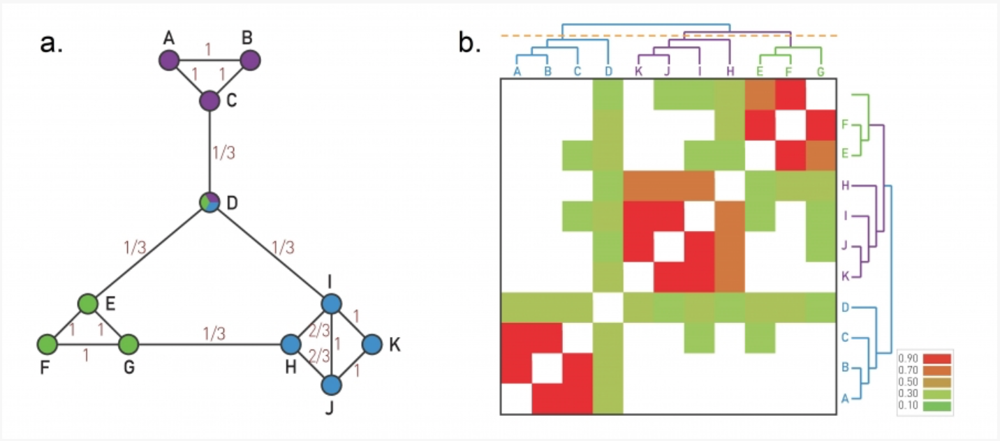




На данном рисунке небольшая сеть, иллюстрирующая расчёт топологического перекрытия $x_{ij}^o$ для пары узлов (подписи над связами и есть перекрытие).

Заметим, что для пары узлов, которые не связаны, но имеют общих соседей перекрытие ненулевое. Так, например, для узлов C и E $$x_{ij}^o=\frac{1}{3}$$



**Шаг 2** Определить групповое сходство 

Как только узлы объеденены в сообщества, мы должны измерить сходство двух сообществ.

Подходы кластерного подобия:


* Единичное ($min$ $x_{ij}$)
* Полное ($max$ $x_{ij}$)
* Среднее ($avg$ $x_{ij}$)

Алгоритм Ravasz использует среднее. То есть определяет сходство 2-х сообществ, как среднее значение $x_{ij}$ по всем парам узлов i и j, которые принадлежат к разным сообществам.   




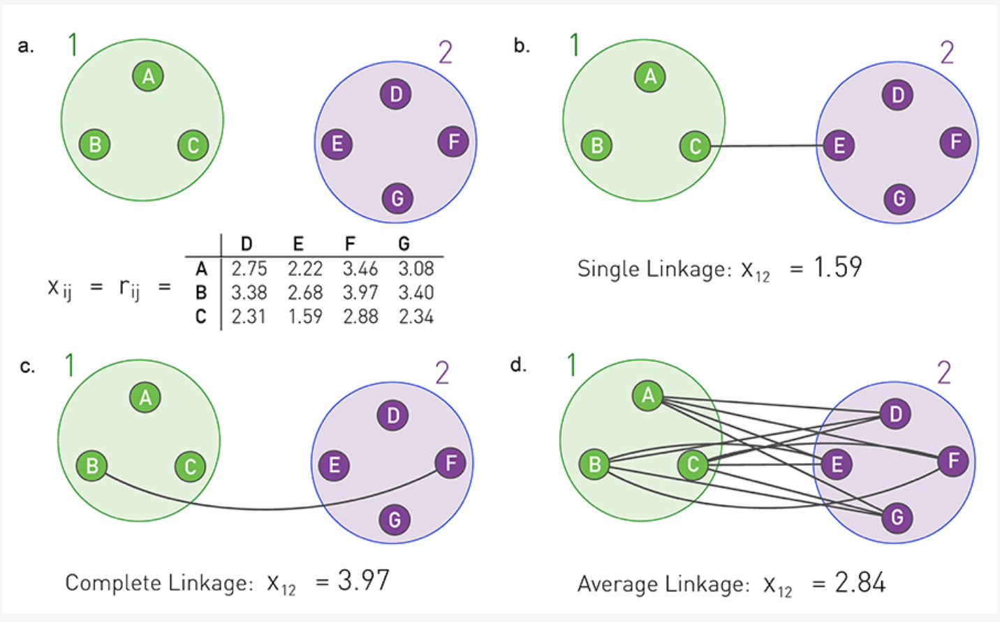

**Шаг 3** Применение иерархической кластеризации

Алгоритм Ravasz использует следующую процедуру для идентефикации сообществ:

* Назначьте каждому узлу собственное сообщество и оцените $x_{ij}$ для всех пар узлов. 
* Найдите пару сообществ или пару узлов с наибольшим $x_{ij}$ и объедините их.
* Рассчитайте сходство между новым сообществом и всеми другими. 
* Повторите шаги 2 и 3, пока не получите одно сообщество.

**Шаг 4** Дендограмма

По сути это визуализация 3 шага в виде дерева. Дендограмма визуализирует порядок, в котором узлы назначенны определенным сообществам.

 Например, дендрограмма сети в примере говорит нам, что алгоритм сначала объединил узлы A с B, K с J и E с F, поскольку каждая из этих пар имеет xij0 = 1. Следующий узел C был добавлен в сообщество (A, B), I - в (K, J), а G - в (E, F).

 Чтобы идентифицировать сообщества, мы должны разрезать дендрограмму. Иерархическая кластеризация не говорит нам, где должно быть этот разрез. Используя, например, разрез, обозначенный пунктирной линией на изображении, мы восстанавливаем три очевидных сообщества (ABC, EFG и HIJK).

 **Вычислительная сложность**

 1 шаг: Для вычисления матрицы подобия сравниваем $N^2$ пар узлов. Следовательно сложность $O(N^2)$.

 2 шаг: Определение группвого сходства требует от нас на каждом шаге определять расстояние от нового сообщества до всех остальных. Делая это N раз получаем сложность $O(N^2)$.

 3-4 шаги: Построение дендограммы это $O(NlogN)$

 Таким образом сложность всего алгоритма:
 $$O(N^2)+O(N^2)+O(NlogN)=O(N^2)$$


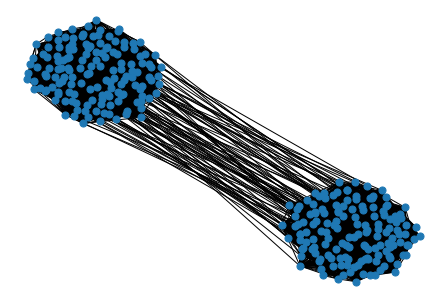

In [ ]:
sizes2=[150,150]
probs2=[[0.4,0.003], [0.003, 0.4]]
B=nx.stochastic_block_model(sizes2, probs2, seed=0)
nx.draw(B, node_size=50)

In [ ]:
B.edges.items()

ItemsView(EdgeView([(0, 4), (0, 8), (0, 13), (0, 16), (0, 21), (0, 26), (0, 33), (0, 36), (0, 38), (0, 41), (0, 44), (0, 45), (0, 47), (0, 49), (0, 53), (0, 54), (0, 57), (0, 68), (0, 70), (0, 71), (0, 72), (0, 76), (0, 84), (0, 86), (0, 98), (0, 103), (0, 105), (0, 106), (0, 108), (0, 110), (0, 111), (0, 113), (0, 118), (0, 122), (0, 123), (0, 125), (0, 126), (0, 128), (0, 129), (0, 130), (0, 133), (0, 135), (0, 136), (0, 137), (0, 139), (0, 140), (0, 142), (0, 143), (0, 145), (0, 146), (1, 2), (1, 5), (1, 8), (1, 9), (1, 12), (1, 17), (1, 18), (1, 20), (1, 22), (1, 24), (1, 25), (1, 26), (1, 27), (1, 29), (1, 30), (1, 31), (1, 36), (1, 39), (1, 40), (1, 41), (1, 42), (1, 44), (1, 52), (1, 54), (1, 55), (1, 62), (1, 67), (1, 70), (1, 75), (1, 76), (1, 78), (1, 81), (1, 82), (1, 85), (1, 87), (1, 89), (1, 90), (1, 91), (1, 95), (1, 98), (1, 100), (1, 101), (1, 102), (1, 108), (1, 115), (1, 117), (1, 119), (1, 120), (1, 121), (1, 124), (1, 126), (1, 127), (1, 129), (1, 130), (1, 132), (

In [ ]:
mat=nx.adjacency_matrix(B)
print(mat.todense())

[[0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


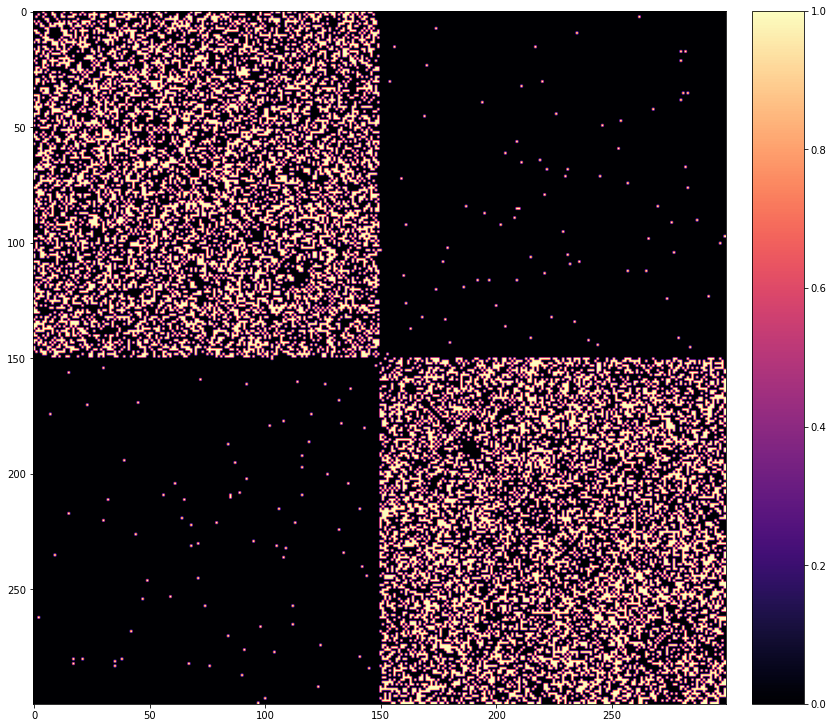

In [ ]:
fig = plt.figure(figsize=(15,10), constrained_layout=True)
adjency=plt.imshow(mat.todense(), cmap='magma')
fig.colorbar(adjency)

In [ ]:
def print_adjensy_matrix(size1, size2, p_in, p_out):
  #создание блочно-стохастической сети и её отрисовка
  sizes=[size1, size2]
  probs=[[p_in, p_out], [p_out, p_in]]
  B=nx.stochastic_block_model(sizes, probs, seed=0)
  nx.draw(B, node_size=50)
  
  #матрица смежности 
  mat=nx.adjacency_matrix(B)

  #визуализация матрицы
  fig = plt.figure(figsize=(15,10), constrained_layout=True)
  adjency=plt.imshow(mat.todense(), cmap='magma')
  fig.colorbar(adjency)




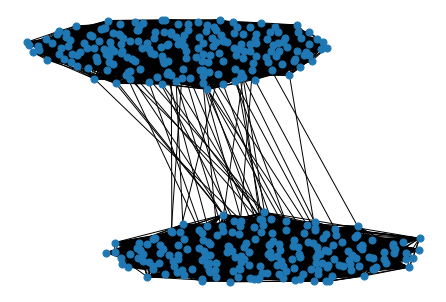

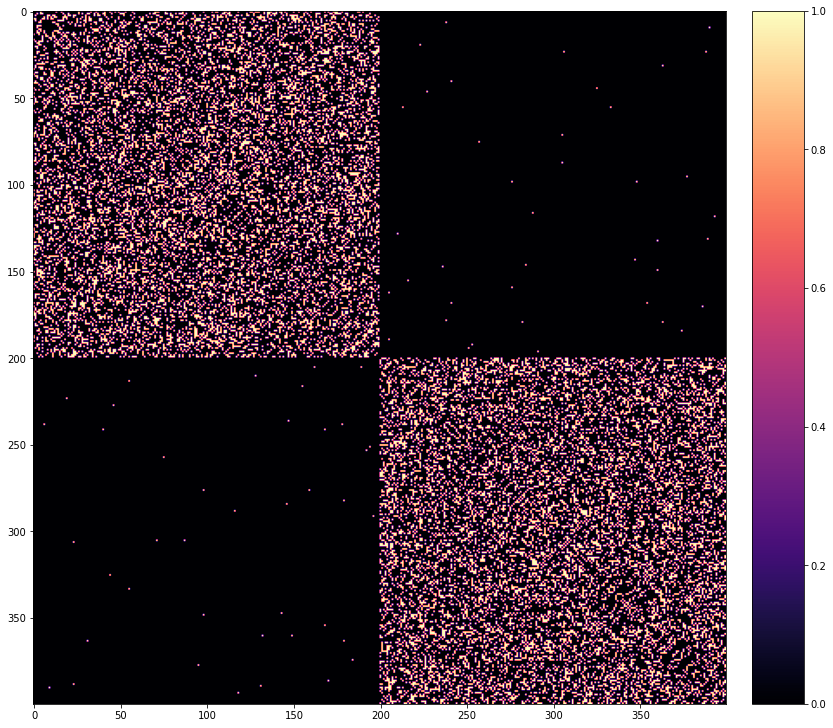

In [ ]:
print_adjensy_matrix(200, 200, 0.3, 0.001)

Вероятность снаружи: 0.0001
Вероятность снаружи: 0.001
Вероятность снаружи: 0.01


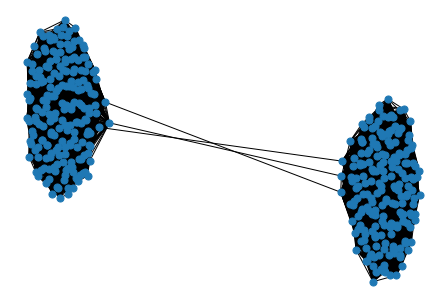

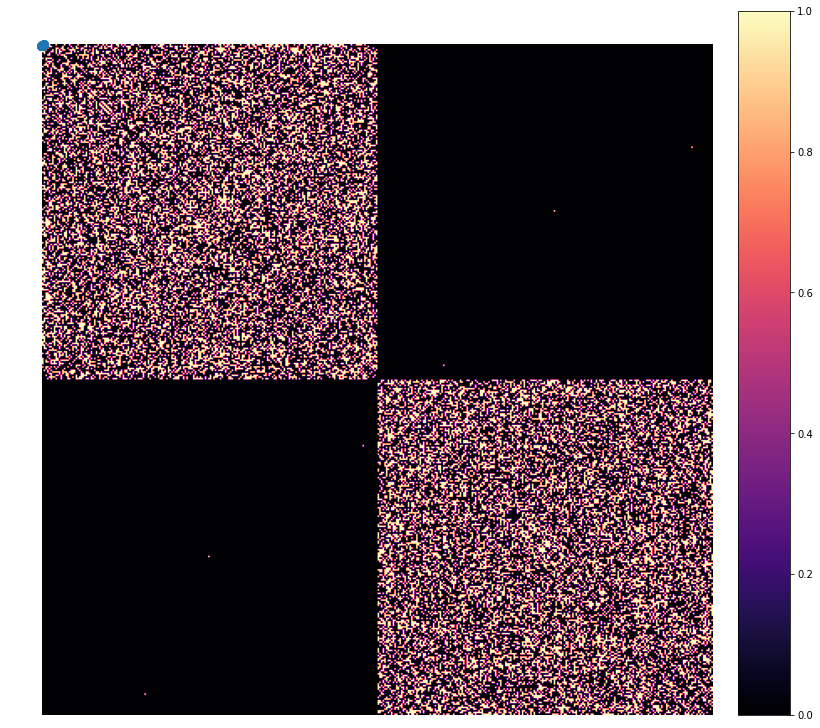

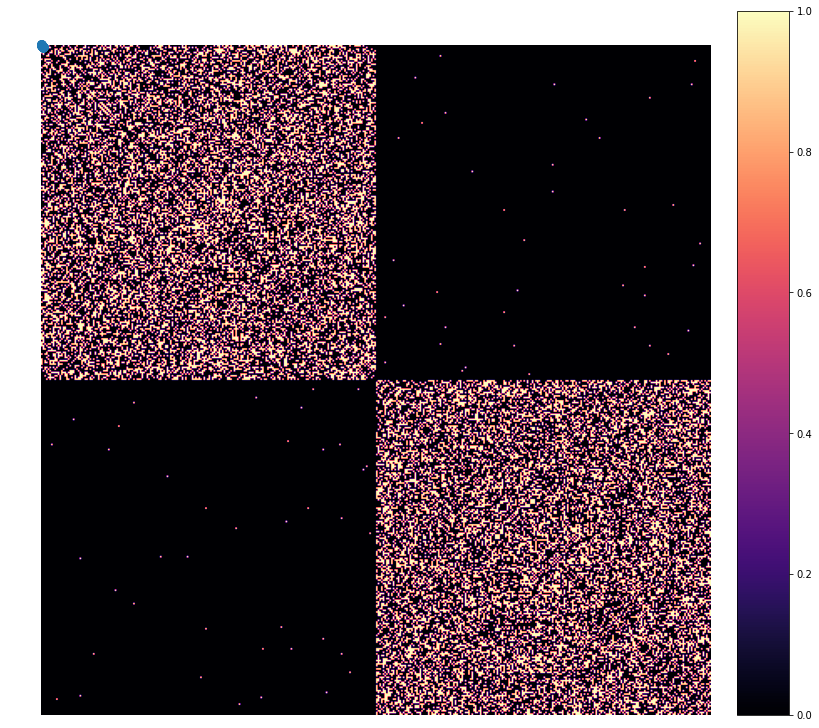

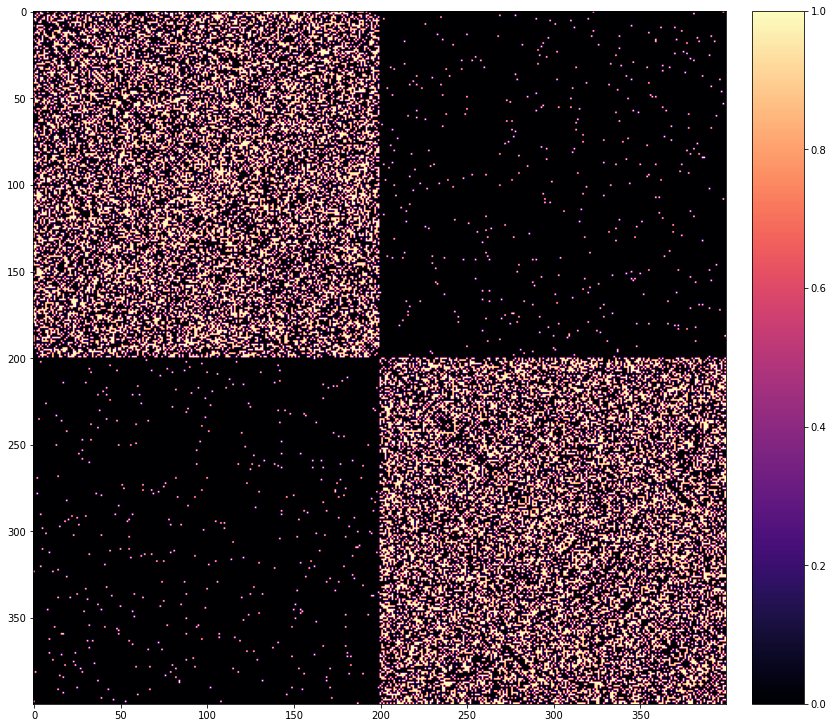

In [ ]:
#фиксируем вероятность внутри, а снаружи меняем
for p_out in [0.0001, 0.001, 0.01]:
  print('Вероятность снаружи:', p_out)
  print_adjensy_matrix(200, 200, 0.4, p_out=p_out)

Вероятность внутри: 0.2
Вероятность внутри: 0.4
Вероятность внутри: 0.8


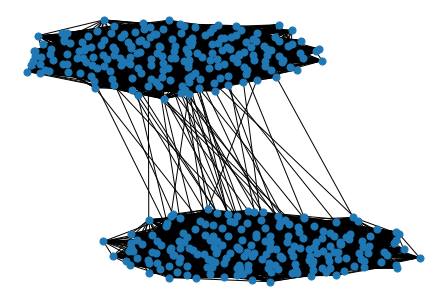

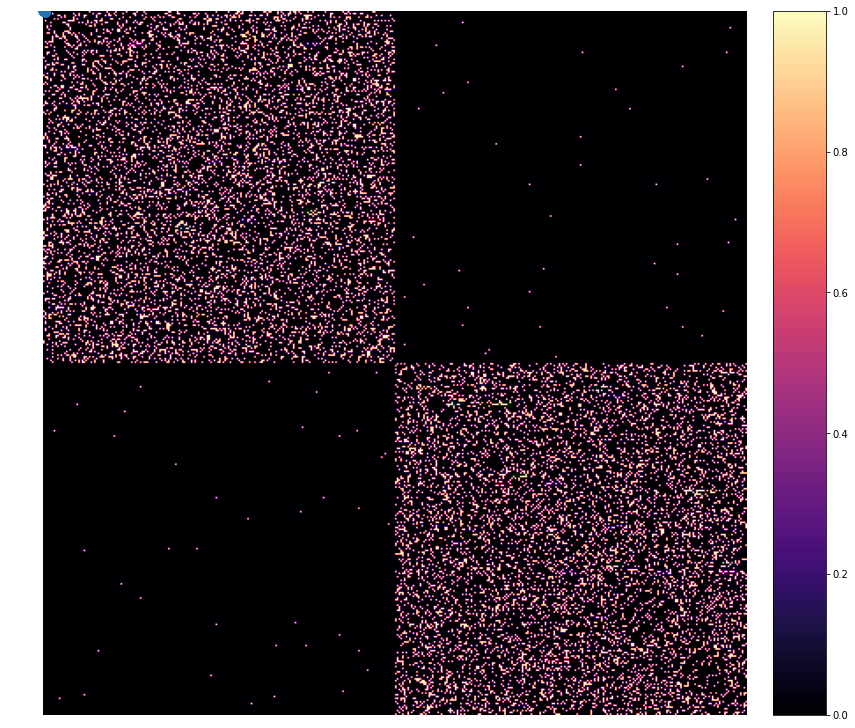

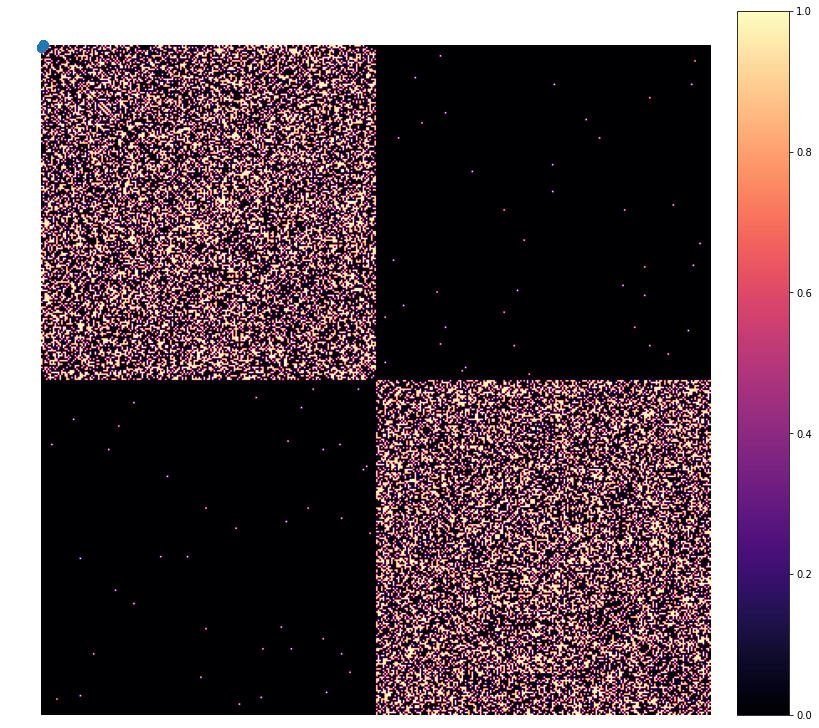

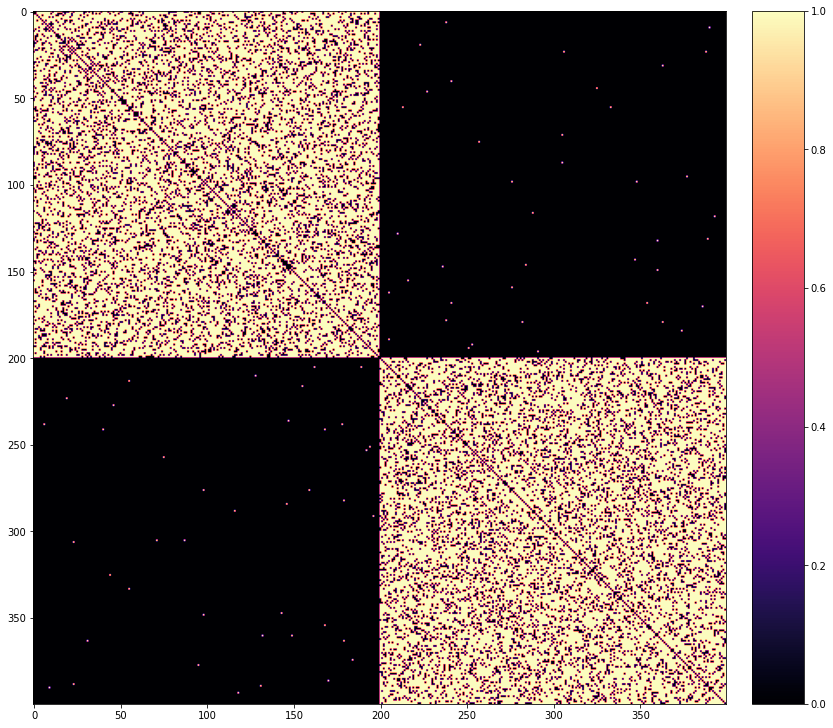

In [ ]:
#фиксируем вероятность снаружи, а внутри меняем 
for p_in in [0.2, 0.4, 0.8]:
  print('Вероятность внутри:', p_in)
  print_adjensy_matrix(200, 200, p_in, 0.001)


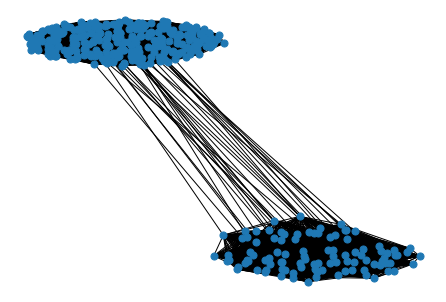

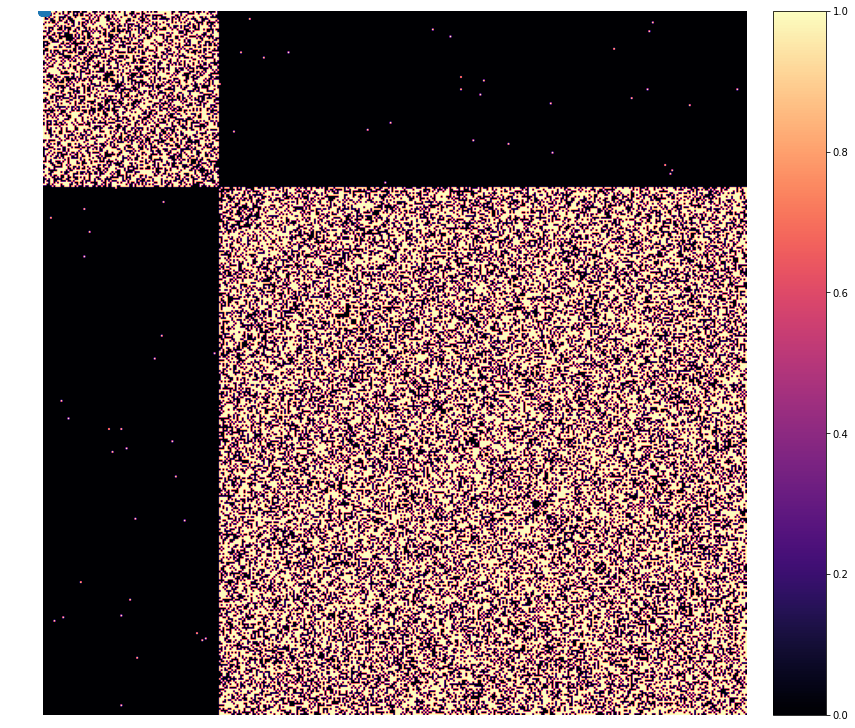

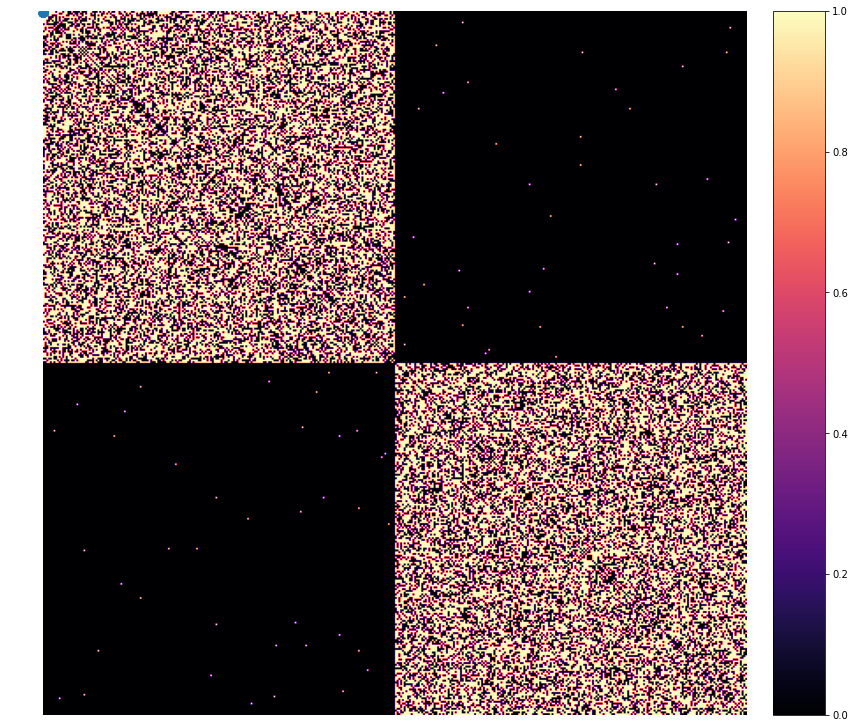

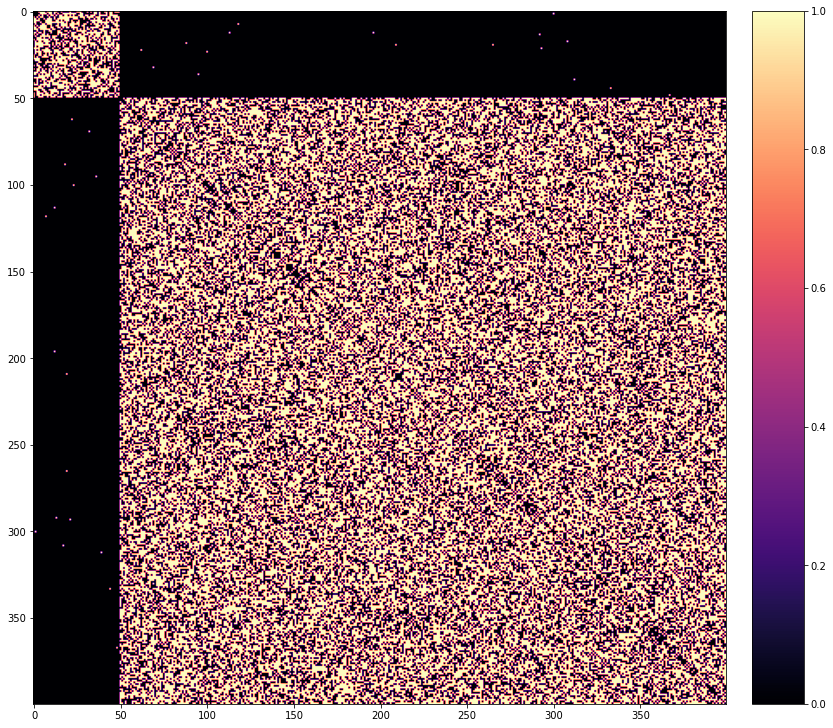

In [ ]:
#фиксируем размер всей сети, но меняем размеры блоков. Пусть например размер всей сети 400
print_adjensy_matrix(100, 300, 0.6, 0.001)
print_adjensy_matrix(200, 200, 0.6, 0.001)
print_adjensy_matrix(50, 350, 0.6, 0.001)

In [ ]:
!pip3 install geomstats

     |████████████████████████████████| 2.9MB 5.8MB/s 
     |████████████████████████████████| 296kB 40.6MB/s 
  Found existing installation: joblib 1.0.0
    Uninstalling joblib-1.0.0:
      Successfully uninstalled joblib-1.0.0


In [ ]:
import logging
import matplotlib.pyplot as plt

import geomstats.backend as gs
import geomstats.visualization as visualization

from geomstats.datasets.utils import load_karate_graph
from geomstats.geometry.poincare_ball import PoincareBall

INFO: Using numpy backend


In [ ]:
gs.random.seed(1234)
dim = 2
max_epochs = 100
lr = .05
n_negative = 2
context_size = 1
karate_graph = load_karate_graph()

In [ ]:
karate_graph.edges.items()

dict_items([(0, [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 17, 19, 21, 31]), (1, [0, 2, 3, 7, 13, 17, 19, 21, 30]), (2, [0, 1, 3, 7, 8, 9, 13, 27, 28, 32]), (3, [0, 1, 2, 7, 12, 13]), (4, [0, 6, 10]), (5, [0, 6, 10, 16]), (6, [0, 4, 5, 16]), (7, [0, 1, 2, 3]), (8, [0, 2, 30, 32, 33]), (9, [2, 33]), (10, [0, 4, 5]), (11, [0]), (12, [0, 3]), (13, [0, 1, 2, 3, 33]), (14, [32, 33]), (15, [32, 33]), (16, [5, 6]), (17, [0, 1]), (18, [32, 33]), (19, [0, 1, 33]), (20, [32, 33]), (21, [0, 1]), (22, [32, 33]), (23, [25, 27, 29, 32, 33]), (24, [25, 27, 31]), (25, [23, 24, 31]), (26, [29, 33]), (27, [2, 23, 24, 33]), (28, [2, 31, 33]), (29, [23, 26, 32, 33]), (30, [1, 8, 32, 33]), (31, [0, 24, 25, 28, 32, 33]), (32, [2, 8, 14, 15, 18, 20, 22, 23, 29, 30, 31, 33]), (33, [8, 9, 13, 14, 15, 18, 19, 20, 22, 23, 26, 27, 28, 29, 30, 31, 32])])

In [ ]:
KC.edges.items()

ItemsView(EdgeView([(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 10), (0, 11), (0, 12), (0, 13), (0, 17), (0, 19), (0, 21), (0, 31), (1, 2), (1, 3), (1, 7), (1, 13), (1, 17), (1, 19), (1, 21), (1, 30), (2, 3), (2, 7), (2, 8), (2, 9), (2, 13), (2, 27), (2, 28), (2, 32), (3, 7), (3, 12), (3, 13), (4, 6), (4, 10), (5, 6), (5, 10), (5, 16), (6, 16), (8, 30), (8, 32), (8, 33), (9, 33), (13, 33), (14, 32), (14, 33), (15, 32), (15, 33), (18, 32), (18, 33), (19, 33), (20, 32), (20, 33), (22, 32), (22, 33), (23, 25), (23, 27), (23, 29), (23, 32), (23, 33), (24, 25), (24, 27), (24, 31), (25, 31), (26, 29), (26, 33), (27, 33), (28, 31), (28, 33), (29, 32), (29, 33), (30, 32), (30, 33), (31, 32), (31, 33), (32, 33)]))

In [ ]:
#клуб карате из networkx
nb_vertices_by_edges =\
    [len(e_2) for _, e_2 in KC.edges.items()]
logging.info('Number of vertices: %s', len(KC.edges))
logging.info(
    'Mean edge-vertex ratio: %s',
    (sum(nb_vertices_by_edges, 0) / len(KC.edges)))

INFO: Number of vertices: 78
INFO: Mean edge-vertex ratio: 0.0


In [ ]:
nb_vertices_by_edges =\
    [len(e_2) for _, e_2 in karate_graph.edges.items()]
logging.info('Number of vertices: %s', len(karate_graph.edges))
logging.info(
    'Mean edge-vertex ratio: %s',
    (sum(nb_vertices_by_edges, 0) / len(karate_graph.edges)))

INFO: Number of vertices: 34
INFO: Mean edge-vertex ratio: 4.588235294117647


In [ ]:
hyperbolic_manifold = PoincareBall(2)

In [ ]:
def grad_squared_distance(point_a, point_b):
    """Gradient of squared hyperbolic distance.

    Gradient of the squared distance based on the
    Ball representation according to point_a

    Parameters
    ----------
    point_a : array-like, shape=[n_samples, dim]
        First point in hyperbolic space.
    point_b : array-like, shape=[n_samples, dim]
        Second point in hyperbolic space.

    Returns
    -------
    dist : array-like, shape=[n_samples, 1]
        Geodesic squared distance between the two points.
    """
    hyperbolic_metric = PoincareBall(2).metric
    log_map = hyperbolic_metric.log(point_b, point_a)

    return -2 * log_map

In [ ]:
def log_sigmoid(vector):
    """Logsigmoid function.

    Apply log sigmoid function

    Parameters
    ----------
    vector : array-like, shape=[n_samples, dim]

    Returns
    -------
    result : array-like, shape=[n_samples, dim]
    """
    return gs.log((1 / (1 + gs.exp(-vector))))

In [ ]:
def grad_log_sigmoid(vector):
    """Gradient of log sigmoid function.

    Parameters
    ----------
    vector : array-like, shape=[n_samples, dim]

    Returns
    -------
    gradient : array-like, shape=[n_samples, dim]
    """
    return 1 / (1 + gs.exp(vector))

In [ ]:
def loss(example_embedding, context_embedding, negative_embedding,
         manifold):
    """Compute loss and grad.

    Compute loss and grad given embedding of the current example,
    embedding of the context and negative sampling embedding.
    """
    n_edges, dim =\
        negative_embedding.shape[0], example_embedding.shape[-1]
    example_embedding = gs.expand_dims(example_embedding, 0)
    context_embedding = gs.expand_dims(context_embedding, 0)
    positive_distance =\
        manifold.metric.squared_dist(
            example_embedding, context_embedding)
    positive_loss =\
        log_sigmoid(-positive_distance)

    reshaped_example_embedding =\
        gs.repeat(example_embedding, n_edges, axis=0)
    negative_distance =\
        manifold.metric.squared_dist(
            reshaped_example_embedding, negative_embedding)
    negative_loss = log_sigmoid(negative_distance)

    total_loss = -(positive_loss + negative_loss.sum())

    positive_log_sigmoid_grad =\
        -grad_log_sigmoid(-positive_distance)

    positive_distance_grad =\
        grad_squared_distance(example_embedding, context_embedding)

    positive_grad =\
        gs.repeat(positive_log_sigmoid_grad, dim, axis=-1)\
        * positive_distance_grad

    negative_distance_grad =\
        grad_squared_distance(reshaped_example_embedding, negative_embedding)

    negative_distance = gs.to_ndarray(negative_distance,
                                      to_ndim=2, axis=-1)
    negative_log_sigmoid_grad =\
        grad_log_sigmoid(negative_distance)

    negative_grad = negative_log_sigmoid_grad\
        * negative_distance_grad
    example_grad = -(positive_grad + negative_grad.sum(axis=0))

    return total_loss, example_grad


In [ ]:
embeddings = gs.random.normal(size=(KC.n_nodes, dim))
embeddings = embeddings * 0.2

AttributeError: ignored

In [ ]:
embeddings = gs.random.normal(size=(karate_graph.n_nodes, dim))
embeddings = embeddings * 0.2

In [ ]:
embeddings

array([[ 0.04237668,  0.14094412],
       [-0.15708704,  0.09241195],
       [ 0.14084565,  0.10470159],
       [-0.18525086,  0.40156859],
       [ 0.04539251, -0.23053182],
       [ 0.12639589,  0.00790254],
       [ 0.09287847, -0.71270333],
       [ 0.26422112,  0.03052611],
       [ 0.03290591, -0.08601914],
       [ 0.15347375,  0.19698397],
       [ 0.05416717,  0.27839724],
       [ 0.01596846, -0.07999292],
       [-0.20557011, -0.11694364],
       [ 0.16331879, -0.01638941],
       [-0.0689532 ,  0.10565763],
       [-0.21379776, -0.10237626],
       [ 0.05824107,  0.11330674],
       [ 0.10071835,  0.05705914],
       [ 0.09685762,  0.2726963 ],
       [-0.15622106, -0.09360353],
       [ 0.24491487, -0.25622166],
       [ 0.1750951 , -0.34214306],
       [-0.09015302,  0.14983276],
       [-0.04078657, -0.03643508],
       [ 0.1361312 , -0.3636998 ],
       [ 0.00941433,  0.07896884],
       [-0.04968641, -0.12354133],
       [-0.1365768 ,  0.08725152],
       [-0.34060255,

In [ ]:
random_walks = karate_graph.random_walk()

In [ ]:
random_walks

array([[ 0,  5, 16,  6,  4,  6],
       [ 1,  3, 12,  3, 12,  3],
       [ 2,  3, 13,  3, 12,  0],
       [ 3,  1, 21,  1, 13,  2],
       [ 4,  6, 16,  5, 10,  4],
       [ 5, 10,  0,  2, 13,  1],
       [ 6, 16,  6,  0, 17,  0],
       [ 7,  2,  1,  3,  2, 32],
       [ 8, 30, 33,  9, 33, 30],
       [ 9, 33, 27, 33, 31, 24],
       [10,  4,  0, 10,  0,  2],
       [11,  0,  8, 30,  8,  2],
       [12,  3,  2,  0, 17,  1],
       [13,  3, 13,  1,  7,  0],
       [14, 33, 31, 24, 27, 33],
       [15, 33, 22, 33, 27, 23],
       [16,  5, 10,  5,  6,  4],
       [17,  0,  7,  2,  0, 21],
       [18, 32, 20, 33, 14, 33],
       [19,  1, 19,  1, 13,  3],
       [20, 33, 23, 29, 33, 20],
       [21,  0,  8, 33, 32, 23],
       [22, 33, 31,  0,  8, 32],
       [23, 29, 33, 27, 24, 25],
       [24, 27, 24, 25, 23, 25],
       [25, 31, 24, 27,  2,  1],
       [26, 29, 33, 29, 23, 25],
       [27,  2,  1, 13,  2,  9],
       [28, 33, 15, 32, 15, 33],
       [29, 26, 29, 33, 14, 33],
       [30

In [ ]:
random_walks2 = KC.random_walk()

AttributeError: ignored

In [ ]:
negative_table_parameter = 5
negative_sampling_table = []

for i, nb_v in enumerate(nb_vertices_by_edges):
    negative_sampling_table +=\
        ([i] * int((nb_v**(3. / 4.))) * negative_table_parameter)

negative_sampling_table = gs.array(negative_sampling_table)

In [ ]:
for epoch in range(max_epochs):
    total_loss = []
    for path in random_walks:

        for example_index, one_path in enumerate(path):
            context_index = path[max(0, example_index - context_size):
                                 min(example_index + context_size,
                                 len(path))]
            negative_index =\
                gs.random.randint(negative_sampling_table.shape[0],
                                  size=(len(context_index),
                                  n_negative))
            negative_index = negative_sampling_table[negative_index]

            example_embedding = embeddings[one_path]
            for one_context_i, one_negative_i in zip(context_index,
                                                     negative_index):
                context_embedding = embeddings[one_context_i]
                negative_embedding = embeddings[one_negative_i]
                l, g_ex = loss(
                    example_embedding,
                    context_embedding,
                    negative_embedding,
                  hyperbolic_manifold)
                total_loss.append(l)

                example_to_update = embeddings[one_path]
                embeddings[one_path] = hyperbolic_manifold.metric.exp(
                    -lr * g_ex, example_to_update)
    logging.info(
        'iteration %d loss_value %f',
        epoch, sum(total_loss, 0) / len(total_loss))

INFO: iteration 0 loss_value 1.804064
INFO: iteration 1 loss_value 1.680576
INFO: iteration 2 loss_value 1.589544
INFO: iteration 3 loss_value 1.535069
INFO: iteration 4 loss_value 1.498140
INFO: iteration 5 loss_value 1.449938
INFO: iteration 6 loss_value 1.419458
INFO: iteration 7 loss_value 1.379841
INFO: iteration 8 loss_value 1.359842
INFO: iteration 9 loss_value 1.344663
INFO: iteration 10 loss_value 1.360478
INFO: iteration 11 loss_value 1.352935
INFO: iteration 12 loss_value 1.349092
INFO: iteration 13 loss_value 1.353689
INFO: iteration 14 loss_value 1.329491
INFO: iteration 15 loss_value 1.306721
INFO: iteration 16 loss_value 1.292071
INFO: iteration 17 loss_value 1.317983
INFO: iteration 18 loss_value 1.325621
INFO: iteration 19 loss_value 1.300494
INFO: iteration 20 loss_value 1.319397
INFO: iteration 21 loss_value 1.292414
INFO: iteration 22 loss_value 1.287179
INFO: iteration 23 loss_value 1.323813
INFO: iteration 24 loss_value 1.307079
INFO: iteration 25 loss_value 1.292

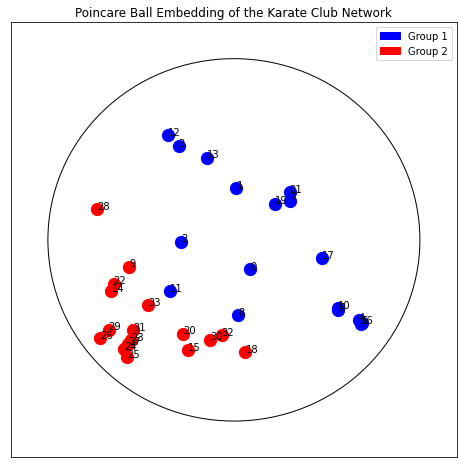

In [ ]:
import matplotlib.patches as mpatches

colors = {1: 'b', 2: 'r'}
group_1 = mpatches.Patch(color=colors[1], label='Group 1')
group_2 = mpatches.Patch(color=colors[2], label='Group 2')

circle = visualization.PoincareDisk(point_type='ball')

fig, ax = plt.subplots(figsize=(8, 8))
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
circle.set_ax(ax)
circle.draw(ax=ax)
for i_embedding, embedding in enumerate(embeddings):
    x = embedding[0]
    y = embedding[1]
    pt_id = i_embedding
    plt.scatter(
        x, y,
        c=colors[karate_graph.labels[pt_id][0]],
        s = 150
        )
    ax.annotate(pt_id, (x,y))

plt.tick_params(
which='both')
plt.title('Poincare Ball Embedding of the Karate Club Network')
plt.legend(handles=[group_1, group_2])
plt.show()